In [1]:
"""
Sergi Caelles (scaelles@vision.ee.ethz.ch)

This file is part of the OSVOS paper presented in:
    Sergi Caelles, Kevis-Kokitsi Maninis, Jordi Pont-Tuset, Laura Leal-Taixe, Daniel Cremers, Luc Van Gool
    One-Shot Video Object Segmentation
    CVPR 2017
Please consider citing the paper if you use this code.
"""
import os
import sys
from PIL import Image
import numpy as np
import tensorflow as tf
slim = tf.contrib.slim
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# Import OSVOS files
# root_folder = os.path.dirname(os.path.realpath(__file__))
# sys.path.append(os.path.abspath(root_folder))
import osvos
from dataset import Dataset
import evalsegm as es
# os.chdir(root_folder)

In [2]:
# calculate miou

# GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
# predFolderPath = result_path

def computeIoU(GTFolderpath, predFolderPath):

    GT_frames = sorted(os.listdir(GTFolderpath))

    counter = 0
    iou = 0
    for img in GT_frames:
        counter += 1
        yTrue_img = np.array(Image.open(os.path.join(GTFolderpath, img)))
        yPred_img = np.array(Image.open(os.path.join(predFolderPath, img)))

    #     plt.imshow(yTrue_img.astype(np.uint8))
    #     plt.show()
    #     plt.imshow(yPred_img.astype(np.uint8))
    #     plt.show()

        iou += es.mean_IU(yPred_img, yTrue_img)

    return iou/counter
    




In [3]:
# User defined parameters
seq_name = "bmx-trees"
file_name = seq_name + 'singledotr10-20'
gpu_id = 0
train_model = False 
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', file_name)


max_training_iters = 20

# Define Dataset
test_frames = sorted(os.listdir(os.path.join('DAVIS', 'JPEGImages', '480p', seq_name)))
test_imgs = [os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, frame) for frame in test_frames]



In [4]:


dataset = Dataset(None, test_imgs, './')

# Test the network
with tf.Graph().as_default():
    with tf.device('/gpu:' + str(gpu_id)):
        #checkpoint_path = os.path.join('models', seq_name, seq_name+'.ckpt-'+str(max_training_iters))
        checkpoint_path = os.path.join('models', file_name, seq_name+'.ckpt-'+str(max_training_iters))
        osvos.test(dataset, checkpoint_path, result_path)



Started loading files...

Done initializing Dataset
INFO:tensorflow:Restoring parameters from models/bmx-treessingledotr10-20/bmx-trees.ckpt-20
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00000.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00001.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00002.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00003.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00004.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00005.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00006.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00007.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00008.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-20/00009.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/

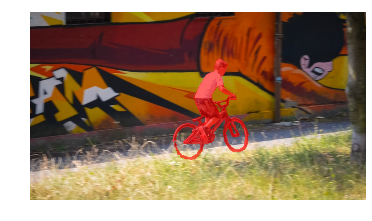

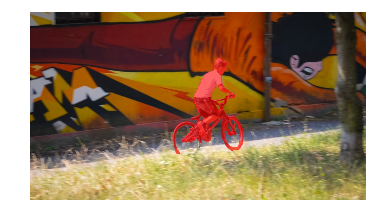

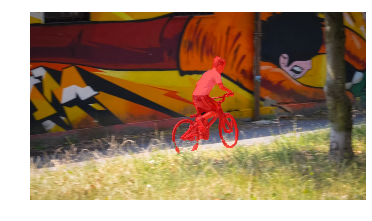

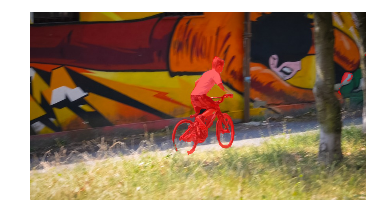

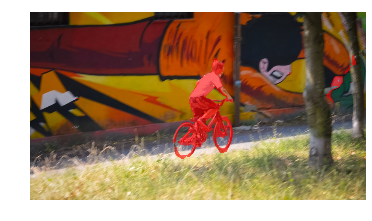

...

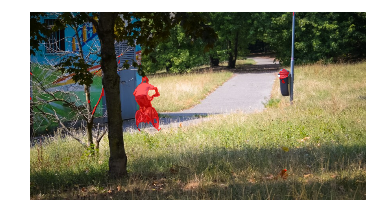

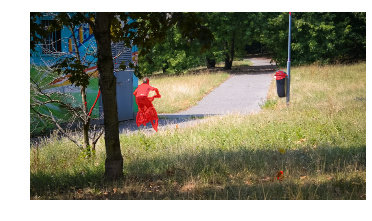

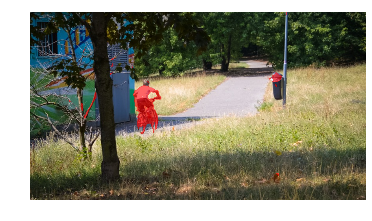

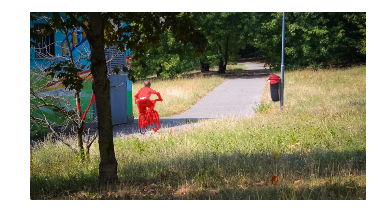

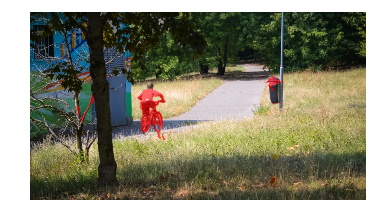

In [5]:
# Show results overlay image


overlay_color = [255, 0, 0]
transparency = 0.6
plt.ion()
for img_p in test_frames:
    frame_num = img_p.split('.')[0]
    img = np.array(Image.open(os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, img_p)))
    mask = np.array(Image.open(os.path.join(result_path, frame_num+'.png')))
    mask = mask/np.max(mask)
    im_over = np.ndarray(img.shape)
    im_over[:, :, 0] = (1 - mask) * img[:, :, 0] + mask * (overlay_color[0]*transparency + (1-transparency)*img[:, :, 0])
    im_over[:, :, 1] = (1 - mask) * img[:, :, 1] + mask * (overlay_color[1]*transparency + (1-transparency)*img[:, :, 1])
    im_over[:, :, 2] = (1 - mask) * img[:, :, 2] + mask * (overlay_color[2]*transparency + (1-transparency)*img[:, :, 2])
    plt.imshow(im_over.astype(np.uint8))
    plt.axis('off')
    plt.show()
    plt.pause(0.01)
    plt.clf()



0.6507975962448619


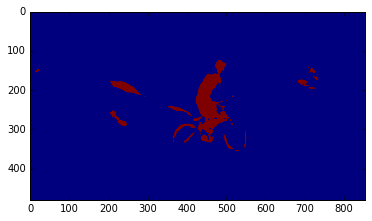

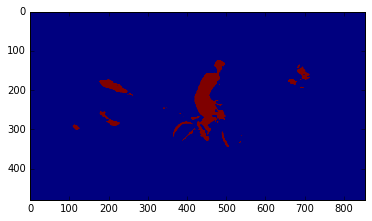

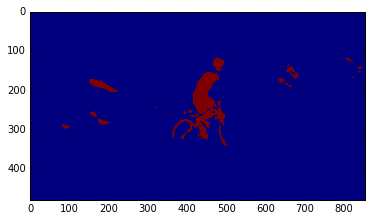

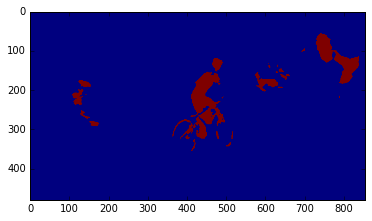

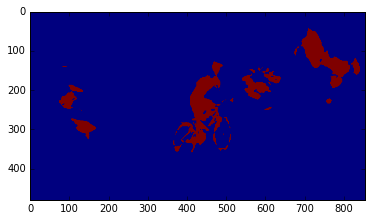

...

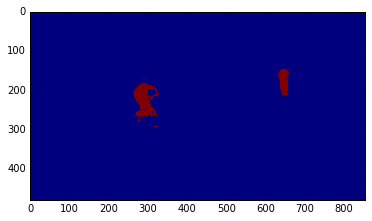

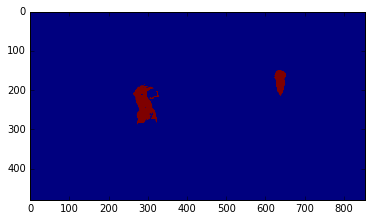

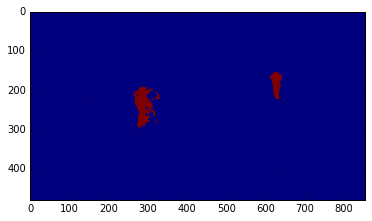

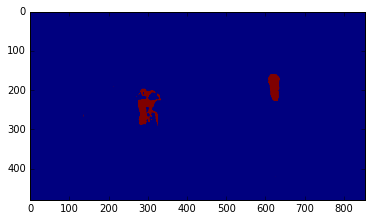

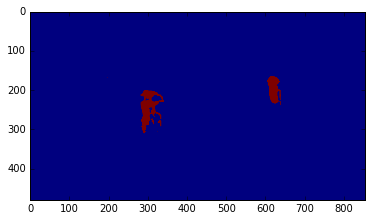

In [8]:
seq_name = "bmx-trees"
result_folder = seq_name+"singledotr10-60iterations"
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        

0.6356002853945065


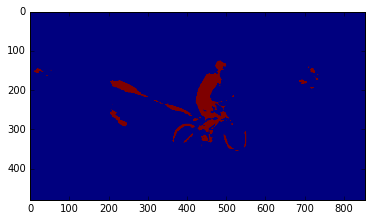

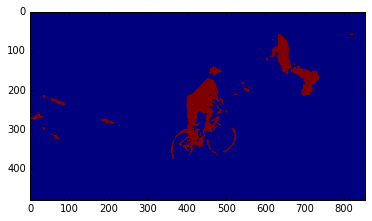

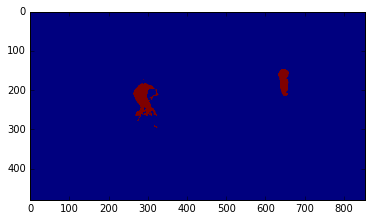

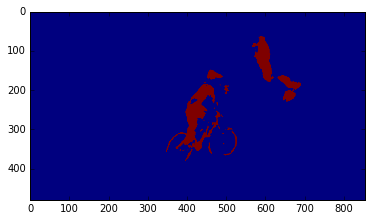

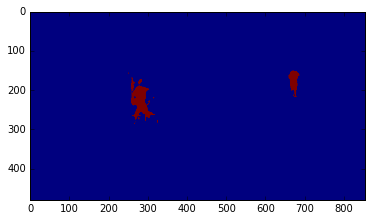

...

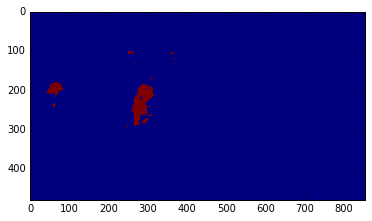

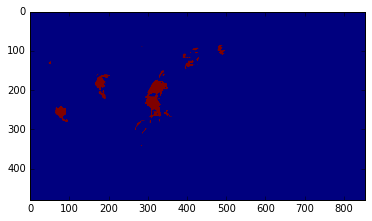

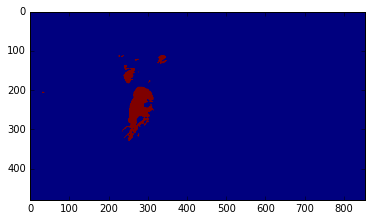

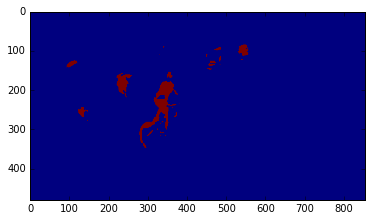

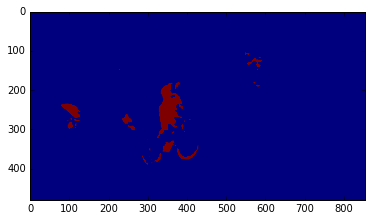

In [4]:

result_folder = "bmx-treesupperhalf"
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        


0.6505359298824057


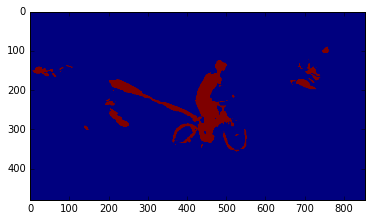

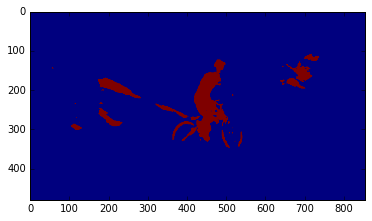

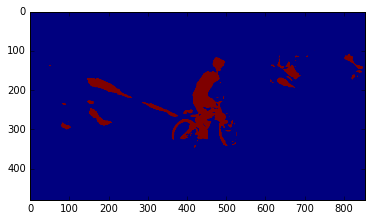

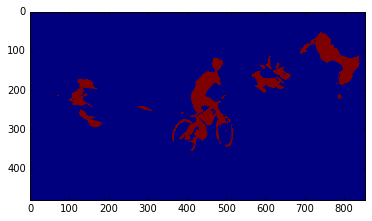

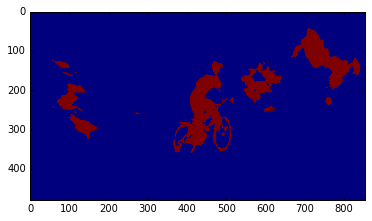

...

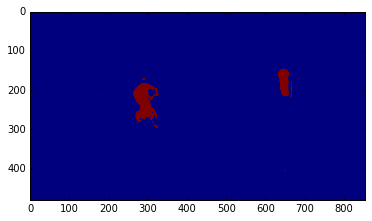

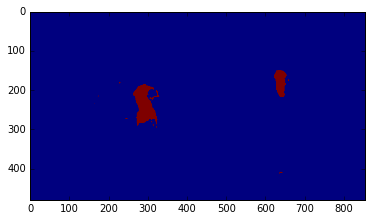

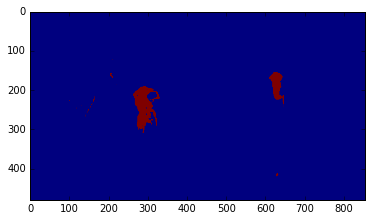

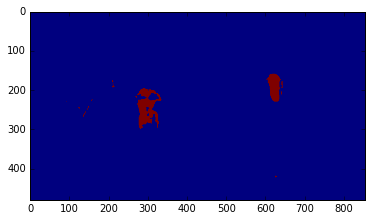

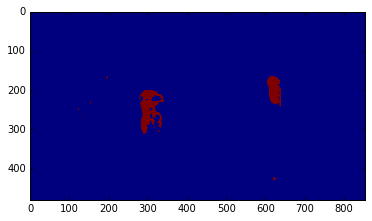

In [5]:

result_folder = "bmx-treeslowerhalf"
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        


0.5995800061212025


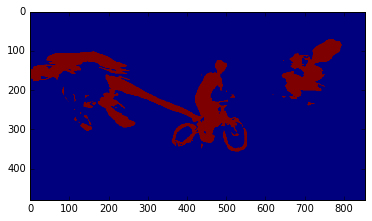

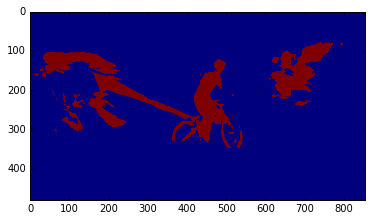

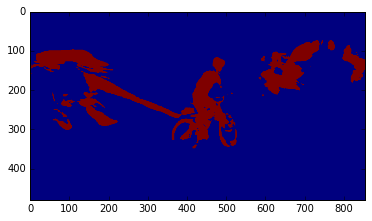

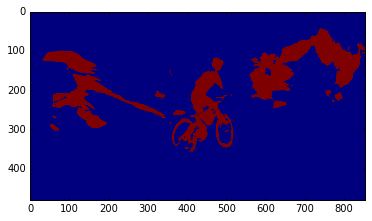

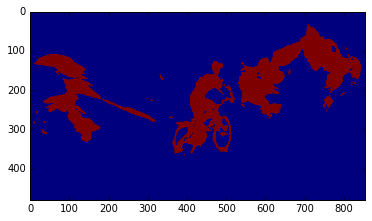

...

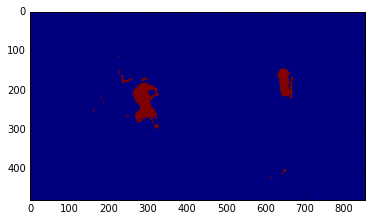

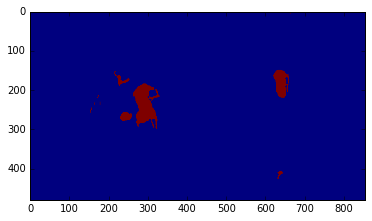

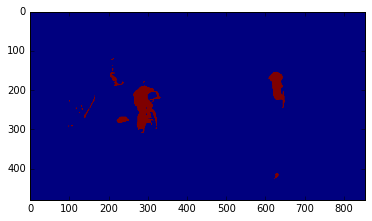

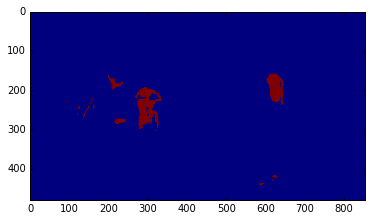

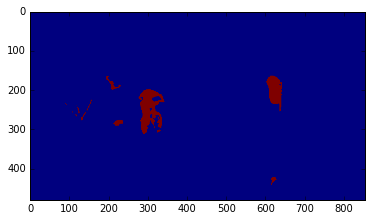

In [4]:
seq_name = "bmx-trees"
result_folder = "bmx-treessingledotr10-10"
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        

0.8126224008368697


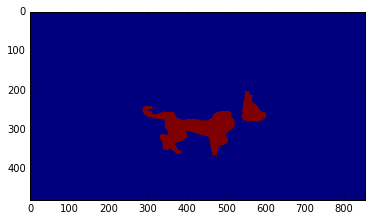

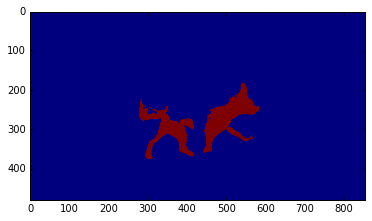

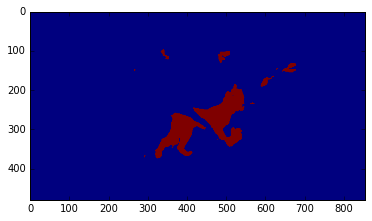

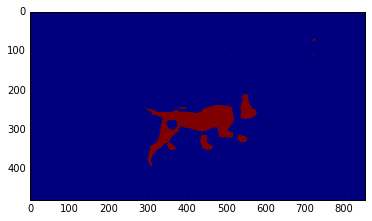

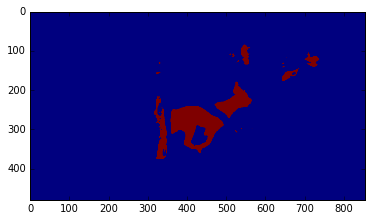

...

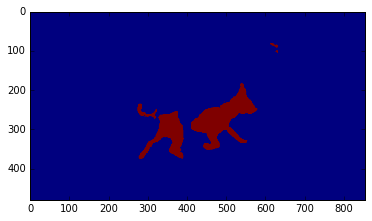

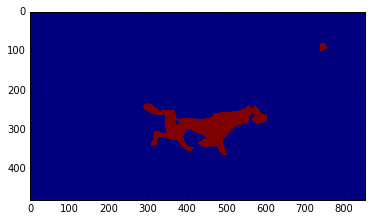

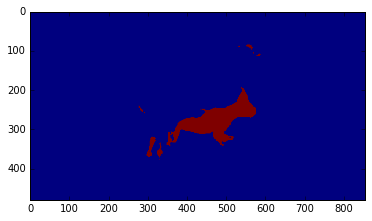

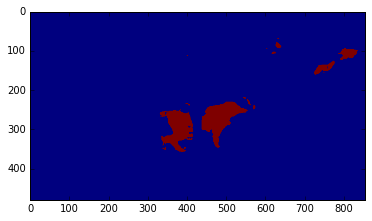

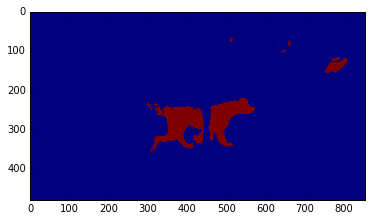

In [7]:
result_folder = "libbysingledotr10"
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        
        

0.9495997254232265


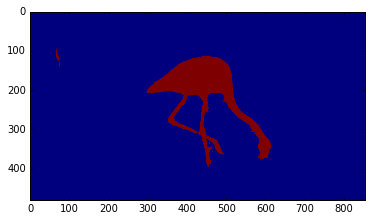

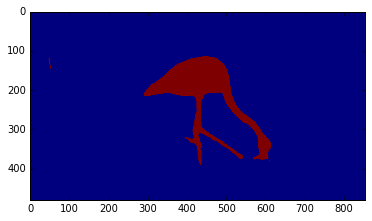

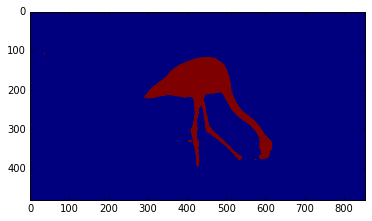

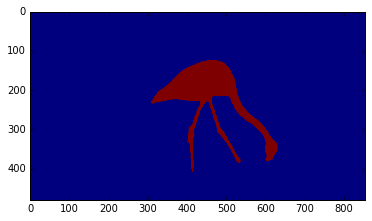

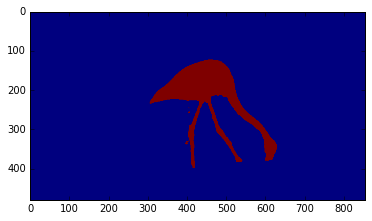

...

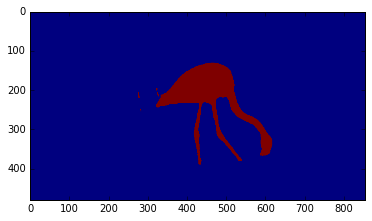

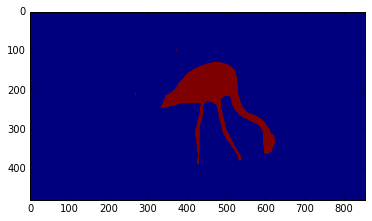

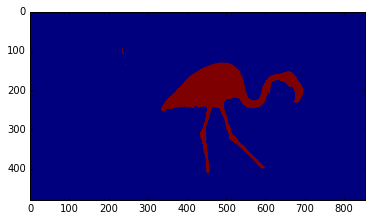

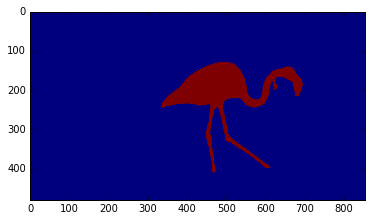

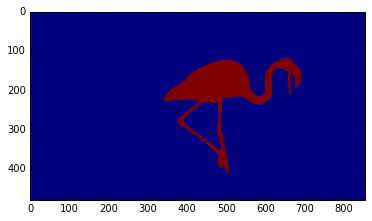

In [5]:

seq_name = "flamingo"
result_folder = "flamingo"
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in os.listdir(result_path):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        

0.7408345022749601


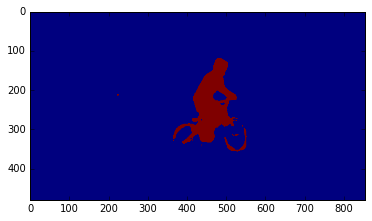

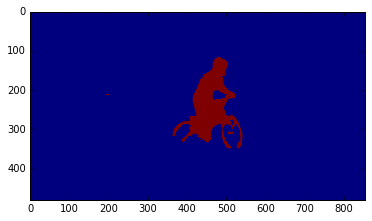

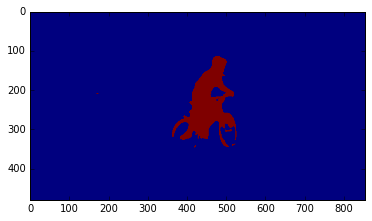

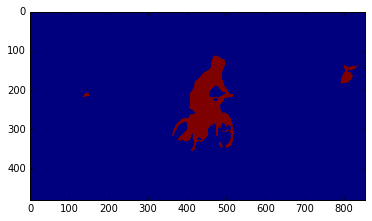

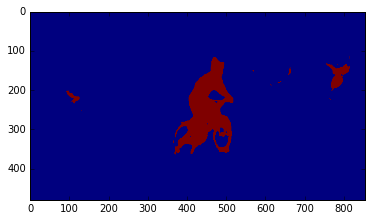

...

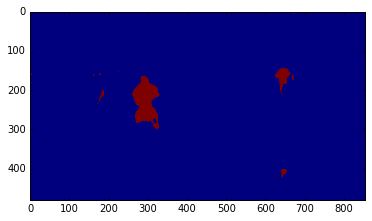

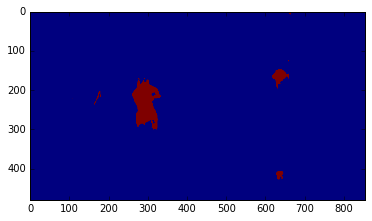

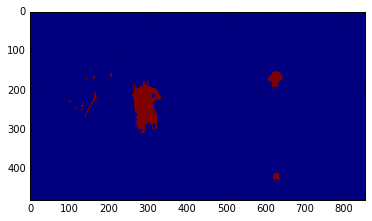

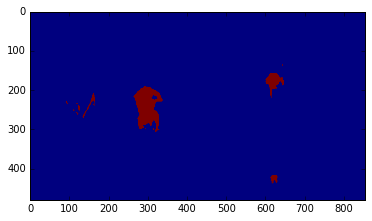

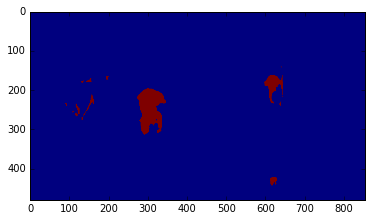

In [5]:
seq_name = "bmx-trees"
result_folder = seq_name+'20'

result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', result_folder)

GTFolderpath = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
predFolderPath = result_path
print computeIoU(GTFolderpath, predFolderPath)

for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        
        

In [9]:

"""
# alternative iou calculation method, need to verify

import numpy as np

def computeIoU(y_pred_batch, y_true_batch):
    return np.mean(np.asarray([pixelAccuracy(y_pred_batch[i], y_true_batch[i]) for i in range(len(y_true_batch))])) 

def pixelAccuracy(y_pred, y_true):
    y_pred = np.argmax(np.reshape(y_pred,[2,y_pred.shape[0],y_pred.shape[1]]),axis=0)
    y_true = np.argmax(np.reshape(y_true,[2,y_true.shape[0],y_true.shape[1]]),axis=0)
    y_pred = y_pred * (y_true>0)
    
    return 1.0 * np.sum((y_pred==y_true)*(y_true>0)) /  np.sum(y_true>0)


segm = np.array([[1,1,1,1,0], [0,1,1,1,1]])
gt   = np.array([[0,0,2,0,0], [0,0,2,0,0]])

print segm.shape
print gt.shape

print es.mean_IU(segm, gt)

"""

(2, 5)
(2, 5)
(0.125, 2, array([0, 1, 2]), 3)
